In [2]:
import os

import matplotlib.pyplot as plt
import numpy as np

from keras import initializers
from keras.datasets import cifar10, mnist
from keras.initializers import RandomNormal
from keras.layers import (BatchNormalization, Conv2D, Conv2DTranspose, Dense,
                          Dropout, Flatten, Input, Reshape, UpSampling2D,
                          ZeroPadding2D)
from keras.layers.advanced_activations import LeakyReLU, ReLU
from keras.models import Model, Sequential
from keras.optimizers import Adam

%matplotlib inline

Using TensorFlow backend.


In [3]:
# For Consistent results
np.random.seed(111)

# The dimension of z/noise
noise_dim = 100

batch_size = 32
steps_per_epoch = 156 # 5000/32
epochs = 1000

save_path = 'dcgan-images'

img_rows, img_cols, channels = 32, 32, 3

optimizer = Adam(0.0002, 0.5)

Instructions for updating:
If using Keras pass *_constraint arguments to layers.


In [4]:
# Create path for saving images
if save_path != None and not os.path.isdir(save_path):
    os.mkdir(save_path)

In [5]:
# Load data
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

classes = {0: 'airplane', 1: 'automobile', 2: 'bird', 3: 'cat', 4: 'deer', 5: 'dog', 6: 'frog', 7: 'horse', 8: 'ship', 9: 'truck'}

170500096/170498071 [==============================] - 11s 0us/step


In [6]:
# Normalize to between -1 and 1
x_train = (x_train.astype(np.float32) - 127.5) / 127.5

# Reshape and only save ship images,i.e. class 8
x_train = x_train[np.where(y_train == 8)[0]].reshape((-1, img_rows, img_cols, channels))

In [8]:
def create_generator():
    generator = Sequential()
    
    # Starting size
    d = 4
    generator.add(Dense(d*d*256, kernel_initializer=RandomNormal(0, 0.02), input_dim=noise_dim))
    generator.add(LeakyReLU(0.2))
    
    # 4x4x256
    generator.add(Reshape((d, d, 256)))
    #generator.add(BatchNormalization(momentum=0.8))   
    # 8x8x128
    generator.add(Conv2DTranspose(128, (4, 4), strides=2, padding='same', kernel_initializer=RandomNormal(0, 0.02)))
    #generator.add(BatchNormalization(momentum=0.8))
    generator.add(LeakyReLU(0.2))
    
    # 16x16x128
    generator.add(Conv2DTranspose(128, (4, 4), strides=2, padding='same', kernel_initializer=RandomNormal(0, 0.02)))
    #generator.add(BatchNormalization(momentum=0.8))
    generator.add(LeakyReLU(0.2))
    
    # 32x32x128
    generator.add(Conv2DTranspose(128, (4, 4), strides=2, padding='same', kernel_initializer=RandomNormal(0, 0.02)))
    #generator.add(BatchNormalization(momentum=0.8))
    generator.add(LeakyReLU(0.2))
    
    # 32x32x3
    generator.add(Conv2D(channels, (3, 3), padding='same', activation='tanh', kernel_initializer=RandomNormal(0, 0.02)))
    return generator

In [10]:
def create_discriminator():
    discriminator = Sequential()
    
    discriminator.add(Conv2D(64, (3, 3), padding='same', kernel_initializer=RandomNormal(0, 0.02), input_shape=(img_cols, img_rows, channels)))
    #discriminator.add(BatchNormalization(momentum=0.8))
    discriminator.add(LeakyReLU(0.2))
    #discriminator.add(Dropout(0.25))
    
    discriminator.add(Conv2D(128, (3, 3), strides=2, padding='same', kernel_initializer=RandomNormal(0, 0.02)))
    #discriminator.add(BatchNormalization(momentum=0.8))
    discriminator.add(LeakyReLU(0.2))
    #discriminator.add(Dropout(0.25))

    discriminator.add(Conv2D(128, (3, 3), strides=2, padding='same', kernel_initializer=RandomNormal(0, 0.02)))
    #discriminator.add(BatchNormalization(momentum=0.8))
    discriminator.add(LeakyReLU(0.2))
    #discriminator.add(Dropout(0.25))

    discriminator.add(Conv2D(256, (3, 3), strides=2, padding='same', kernel_initializer=RandomNormal(0, 0.02)))
    #discriminator.add(BatchNormalization(momentum=0.8))
    discriminator.add(LeakyReLU(0.2))
    #discriminator.add(Dropout(0.25))
    
    discriminator.add(Flatten())
    discriminator.add(Dropout(0.4))
    discriminator.add(Dense(1, activation='sigmoid'))
    
    discriminator.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])
    return discriminator

In [11]:
# create discriminator model
discriminator = create_discriminator()
print('DISCRIMINATOR SUMMARY')
discriminator.summary()

# create generator model
generator = create_generator()
print('GENERATOR SUMMARY')
generator.summary()

# Link the two models to create the GAN
gan = Sequential()
# add generator model
gan.add(generator)
# Make the discriminator untrainable when we are training the generator.  
# This doesn't effect the discriminator by itself
discriminator.trainable = False
gan.add(discriminator)

gan.compile(loss='binary_crossentropy', optimizer=optimizer)

print('GAN SUMMARY')
gan.summary()

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
DISCRIMINATOR SUMMARY
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 32, 32, 64)        1792      
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 16, 16, 128)       73856     
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 16, 16, 128)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 8, 8, 128)         147584    
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 8, 8, 128)         0         
____

In [12]:
# Display images, and save them if the epoch number is specified
def show_images(noise, epoch=None):
    generated_images = generator.predict(noise)
    plt.figure(figsize=(10, 10))
    
    for i, image in enumerate(generated_images):
        plt.subplot(10, 10, i+1)
        if channels == 1:
            plt.imshow(np.clip(image.reshape((img_rows, img_cols)), 0.0, 1.0), cmap='gray')
        else:
            plt.imshow(np.clip(image.reshape((img_rows, img_cols, channels)), 0.0, 1.0))
        plt.axis('off')
    
    plt.tight_layout()
    
    if epoch != None and save_path != None:
        plt.savefig(f'{save_path}/gan-images_epoch-{epoch}.png')
    plt.show()

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


Epoch: 0/1000 	 Discriminator Loss: [0.57724094, 0.453125] 		 Generator Loss: 1.8031373023986816


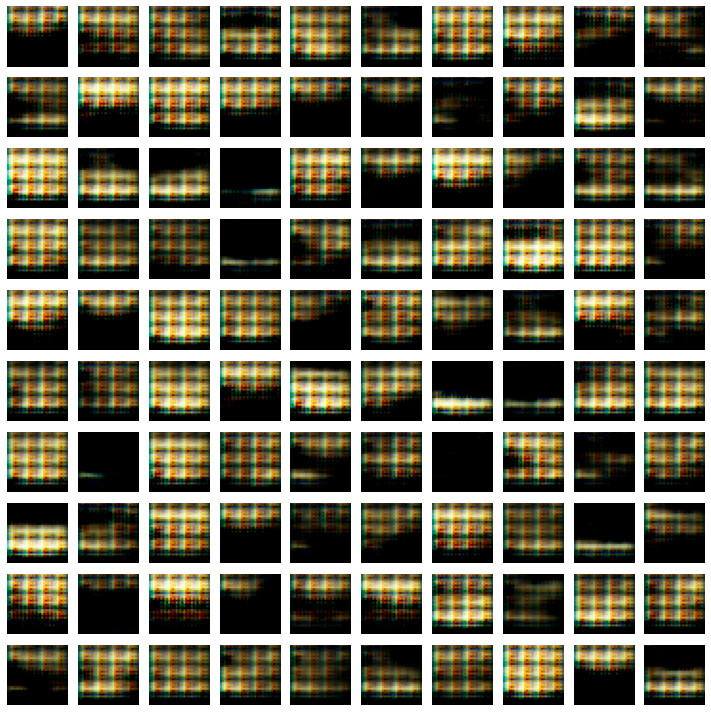

Epoch: 1/1000 	 Discriminator Loss: [0.4857723, 0.484375] 		 Generator Loss: 1.5950018167495728
Epoch: 2/1000 	 Discriminator Loss: [0.5162815, 0.5] 		 Generator Loss: 1.388199806213379
Epoch: 3/1000 	 Discriminator Loss: [0.6308975, 0.40625] 		 Generator Loss: 0.9602136611938477
Epoch: 4/1000 	 Discriminator Loss: [0.6051103, 0.5] 		 Generator Loss: 1.62382173538208
Epoch: 5/1000 	 Discriminator Loss: [0.6160698, 0.484375] 		 Generator Loss: 1.084849238395691
Epoch: 6/1000 	 Discriminator Loss: [0.6149542, 0.484375] 		 Generator Loss: 1.1009681224822998
Epoch: 7/1000 	 Discriminator Loss: [0.49281752, 0.5] 		 Generator Loss: 1.3452410697937012
Epoch: 8/1000 	 Discriminator Loss: [0.60181755, 0.46875] 		 Generator Loss: 1.3747355937957764
Epoch: 9/1000 	 Discriminator Loss: [0.5030727, 0.40625] 		 Generator Loss: 1.729820728302002
Epoch: 10/1000 	 Discriminator Loss: [0.549883, 0.453125] 		 Generator Loss: 1.1763451099395752
Epoch: 11/1000 	 Discriminator Loss: [0.519681, 0.421875] 		 

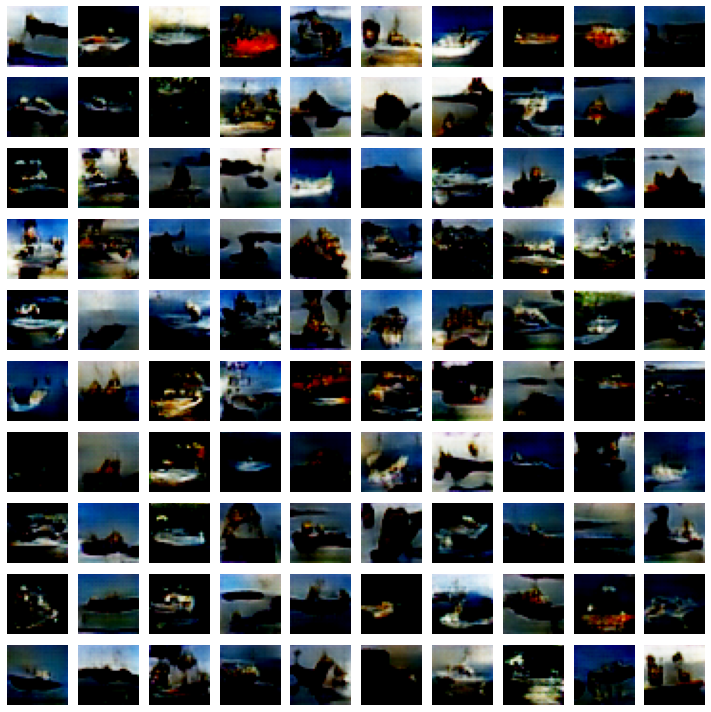

Epoch: 51/1000 	 Discriminator Loss: [0.5983279, 0.484375] 		 Generator Loss: 1.1968713998794556
Epoch: 52/1000 	 Discriminator Loss: [0.63054454, 0.4375] 		 Generator Loss: 1.1245079040527344
Epoch: 53/1000 	 Discriminator Loss: [0.5901154, 0.453125] 		 Generator Loss: 1.3000247478485107
Epoch: 54/1000 	 Discriminator Loss: [0.5229051, 0.453125] 		 Generator Loss: 1.2108333110809326
Epoch: 55/1000 	 Discriminator Loss: [0.56991374, 0.484375] 		 Generator Loss: 1.1142613887786865
Epoch: 56/1000 	 Discriminator Loss: [0.7042723, 0.28125] 		 Generator Loss: 1.3232402801513672
Epoch: 57/1000 	 Discriminator Loss: [0.5910088, 0.453125] 		 Generator Loss: 1.2464696168899536
Epoch: 58/1000 	 Discriminator Loss: [0.63409406, 0.4375] 		 Generator Loss: 1.5535805225372314
Epoch: 59/1000 	 Discriminator Loss: [0.5380223, 0.40625] 		 Generator Loss: 1.6828457117080688
Epoch: 60/1000 	 Discriminator Loss: [0.63294494, 0.359375] 		 Generator Loss: 1.2838983535766602
Epoch: 61/1000 	 Discriminator L

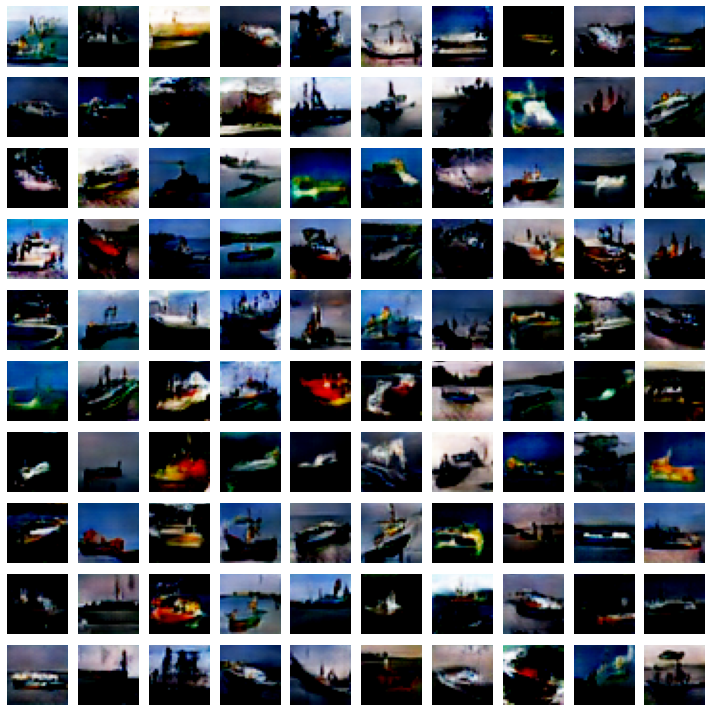

Epoch: 101/1000 	 Discriminator Loss: [0.5193219, 0.390625] 		 Generator Loss: 1.711374282836914
Epoch: 102/1000 	 Discriminator Loss: [0.5536101, 0.484375] 		 Generator Loss: 1.6139745712280273
Epoch: 103/1000 	 Discriminator Loss: [0.5331896, 0.484375] 		 Generator Loss: 1.3231288194656372
Epoch: 104/1000 	 Discriminator Loss: [0.5323433, 0.390625] 		 Generator Loss: 1.6951532363891602
Epoch: 105/1000 	 Discriminator Loss: [0.4875722, 0.421875] 		 Generator Loss: 1.5513968467712402
Epoch: 106/1000 	 Discriminator Loss: [0.520252, 0.453125] 		 Generator Loss: 1.2044036388397217
Epoch: 107/1000 	 Discriminator Loss: [0.43146938, 0.5] 		 Generator Loss: 1.5518664121627808
Epoch: 108/1000 	 Discriminator Loss: [0.52881444, 0.390625] 		 Generator Loss: 1.7687101364135742
Epoch: 109/1000 	 Discriminator Loss: [0.506296, 0.484375] 		 Generator Loss: 1.4503417015075684
Epoch: 110/1000 	 Discriminator Loss: [0.49067855, 0.46875] 		 Generator Loss: 1.5578420162200928
Epoch: 111/1000 	 Discrimi

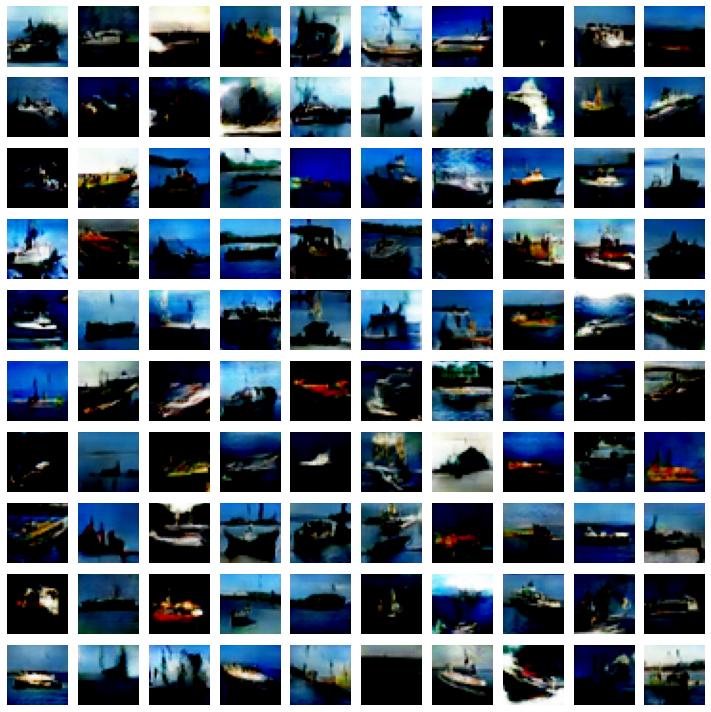

Epoch: 151/1000 	 Discriminator Loss: [0.4392379, 0.4375] 		 Generator Loss: 1.8120100498199463
Epoch: 152/1000 	 Discriminator Loss: [0.4179256, 0.4375] 		 Generator Loss: 2.1852047443389893
Epoch: 153/1000 	 Discriminator Loss: [0.44577155, 0.453125] 		 Generator Loss: 2.1052074432373047
Epoch: 154/1000 	 Discriminator Loss: [0.4806828, 0.421875] 		 Generator Loss: 1.7328159809112549
Epoch: 155/1000 	 Discriminator Loss: [0.37851837, 0.453125] 		 Generator Loss: 2.3066773414611816
Epoch: 156/1000 	 Discriminator Loss: [0.47393638, 0.453125] 		 Generator Loss: 1.5871891975402832
Epoch: 157/1000 	 Discriminator Loss: [0.5197983, 0.453125] 		 Generator Loss: 1.8634989261627197
Epoch: 158/1000 	 Discriminator Loss: [0.4365492, 0.453125] 		 Generator Loss: 2.1028356552124023
Epoch: 159/1000 	 Discriminator Loss: [0.43575564, 0.46875] 		 Generator Loss: 2.368222236633301
Epoch: 160/1000 	 Discriminator Loss: [0.37544072, 0.484375] 		 Generator Loss: 1.9214632511138916
Epoch: 161/1000 	 Dis

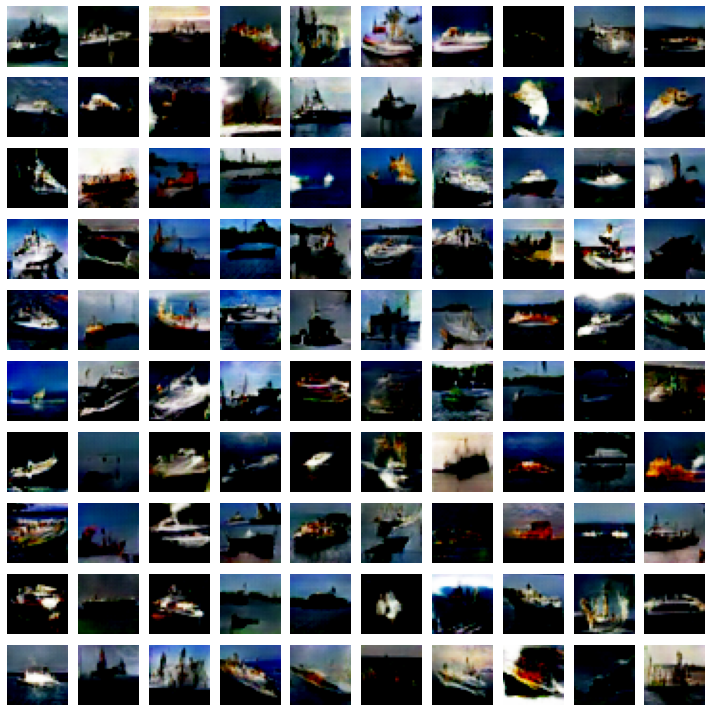

Epoch: 201/1000 	 Discriminator Loss: [0.43557906, 0.4375] 		 Generator Loss: 2.2019290924072266
Epoch: 202/1000 	 Discriminator Loss: [0.3730691, 0.484375] 		 Generator Loss: 2.36794376373291
Epoch: 203/1000 	 Discriminator Loss: [0.38355148, 0.46875] 		 Generator Loss: 2.3381333351135254
Epoch: 204/1000 	 Discriminator Loss: [0.40367907, 0.453125] 		 Generator Loss: 2.4670920372009277
Epoch: 205/1000 	 Discriminator Loss: [0.39140683, 0.453125] 		 Generator Loss: 2.3750863075256348
Epoch: 206/1000 	 Discriminator Loss: [0.41622582, 0.453125] 		 Generator Loss: 2.2030441761016846
Epoch: 207/1000 	 Discriminator Loss: [0.38455302, 0.421875] 		 Generator Loss: 2.3681797981262207
Epoch: 208/1000 	 Discriminator Loss: [0.4946752, 0.390625] 		 Generator Loss: 2.4369163513183594
Epoch: 209/1000 	 Discriminator Loss: [0.39616722, 0.421875] 		 Generator Loss: 2.6552600860595703
Epoch: 210/1000 	 Discriminator Loss: [0.38774288, 0.46875] 		 Generator Loss: 2.163954734802246
Epoch: 211/1000 	 D

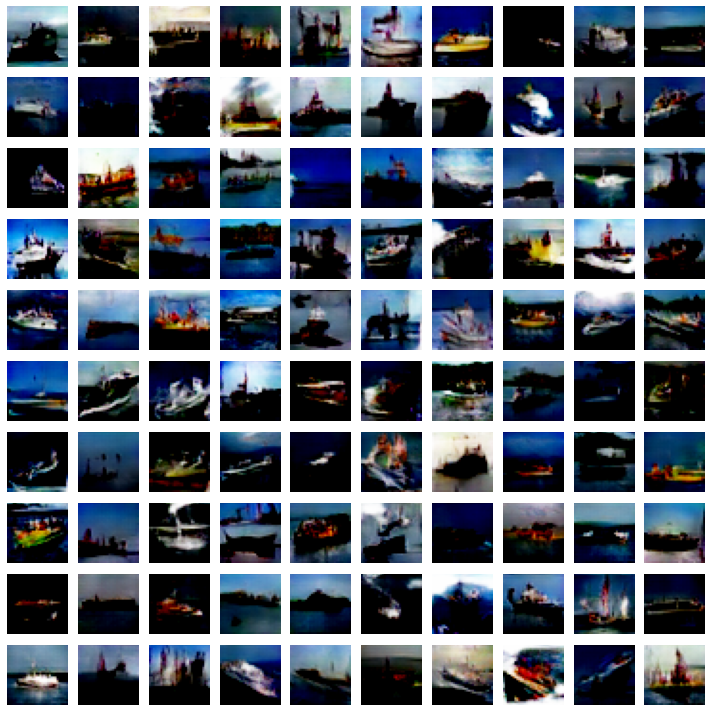

Epoch: 251/1000 	 Discriminator Loss: [0.3924448, 0.4375] 		 Generator Loss: 2.566277503967285
Epoch: 252/1000 	 Discriminator Loss: [0.4198346, 0.453125] 		 Generator Loss: 2.262542963027954
Epoch: 253/1000 	 Discriminator Loss: [0.42010897, 0.4375] 		 Generator Loss: 2.5150933265686035
Epoch: 254/1000 	 Discriminator Loss: [0.30230144, 0.484375] 		 Generator Loss: 2.99066162109375
Epoch: 255/1000 	 Discriminator Loss: [0.32793334, 0.484375] 		 Generator Loss: 2.9513044357299805
Epoch: 256/1000 	 Discriminator Loss: [0.5172628, 0.375] 		 Generator Loss: 3.262906551361084
Epoch: 257/1000 	 Discriminator Loss: [0.44902635, 0.453125] 		 Generator Loss: 2.8790202140808105
Epoch: 258/1000 	 Discriminator Loss: [0.3278945, 0.5] 		 Generator Loss: 2.4245047569274902
Epoch: 259/1000 	 Discriminator Loss: [0.36220756, 0.46875] 		 Generator Loss: 3.2070164680480957
Epoch: 260/1000 	 Discriminator Loss: [0.40463167, 0.40625] 		 Generator Loss: 3.123811721801758
Epoch: 261/1000 	 Discriminator Lo

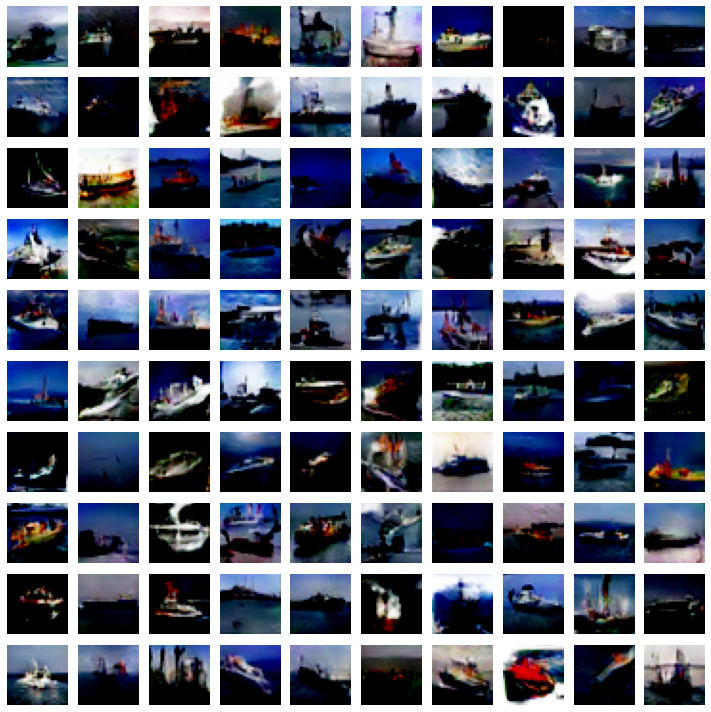

Epoch: 301/1000 	 Discriminator Loss: [0.31745356, 0.46875] 		 Generator Loss: 3.4264683723449707
Epoch: 302/1000 	 Discriminator Loss: [0.3536297, 0.5] 		 Generator Loss: 3.1122078895568848
Epoch: 303/1000 	 Discriminator Loss: [0.40652138, 0.46875] 		 Generator Loss: 3.027282953262329
Epoch: 304/1000 	 Discriminator Loss: [0.45644224, 0.40625] 		 Generator Loss: 3.6300771236419678
Epoch: 305/1000 	 Discriminator Loss: [0.3015793, 0.484375] 		 Generator Loss: 2.236189365386963
Epoch: 306/1000 	 Discriminator Loss: [0.38744032, 0.46875] 		 Generator Loss: 2.3750624656677246
Epoch: 307/1000 	 Discriminator Loss: [0.3440305, 0.46875] 		 Generator Loss: 2.491997718811035
Epoch: 308/1000 	 Discriminator Loss: [0.34065336, 0.5] 		 Generator Loss: 3.2099907398223877
Epoch: 309/1000 	 Discriminator Loss: [0.40875152, 0.484375] 		 Generator Loss: 2.7849934101104736
Epoch: 310/1000 	 Discriminator Loss: [0.31516474, 0.46875] 		 Generator Loss: 2.392359733581543
Epoch: 311/1000 	 Discriminator L

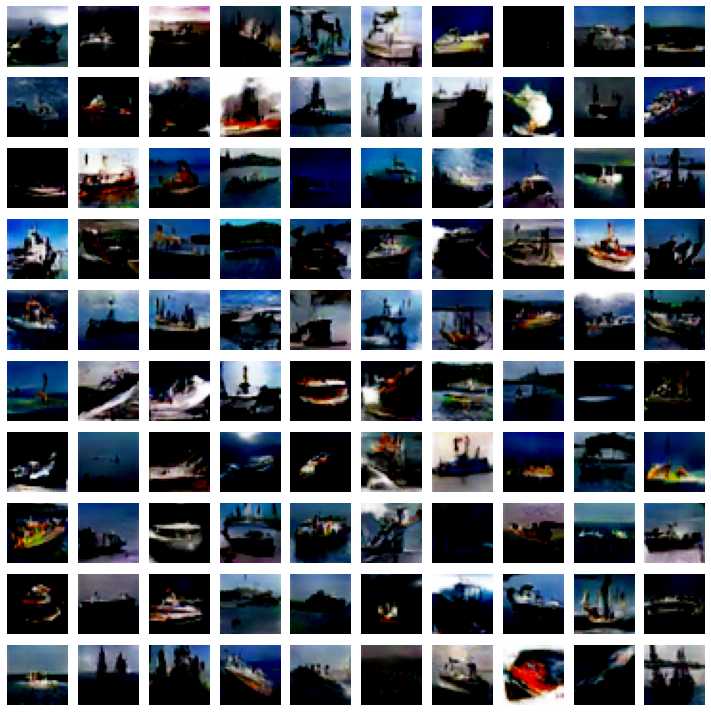

Epoch: 351/1000 	 Discriminator Loss: [0.30988717, 0.5] 		 Generator Loss: 3.0428152084350586
Epoch: 352/1000 	 Discriminator Loss: [0.3742981, 0.453125] 		 Generator Loss: 3.0807526111602783
Epoch: 353/1000 	 Discriminator Loss: [0.2872383, 0.484375] 		 Generator Loss: 3.4661760330200195
Epoch: 354/1000 	 Discriminator Loss: [0.28363898, 0.5] 		 Generator Loss: 2.819591522216797
Epoch: 355/1000 	 Discriminator Loss: [0.34120452, 0.46875] 		 Generator Loss: 2.8481829166412354
Epoch: 356/1000 	 Discriminator Loss: [0.37962765, 0.4375] 		 Generator Loss: 3.1643433570861816
Epoch: 357/1000 	 Discriminator Loss: [0.3531133, 0.484375] 		 Generator Loss: 3.387941837310791
Epoch: 358/1000 	 Discriminator Loss: [0.36476922, 0.453125] 		 Generator Loss: 2.8861641883850098
Epoch: 359/1000 	 Discriminator Loss: [0.28013507, 0.5] 		 Generator Loss: 3.615039348602295
Epoch: 360/1000 	 Discriminator Loss: [0.33198798, 0.484375] 		 Generator Loss: 3.542574882507324
Epoch: 361/1000 	 Discriminator Los

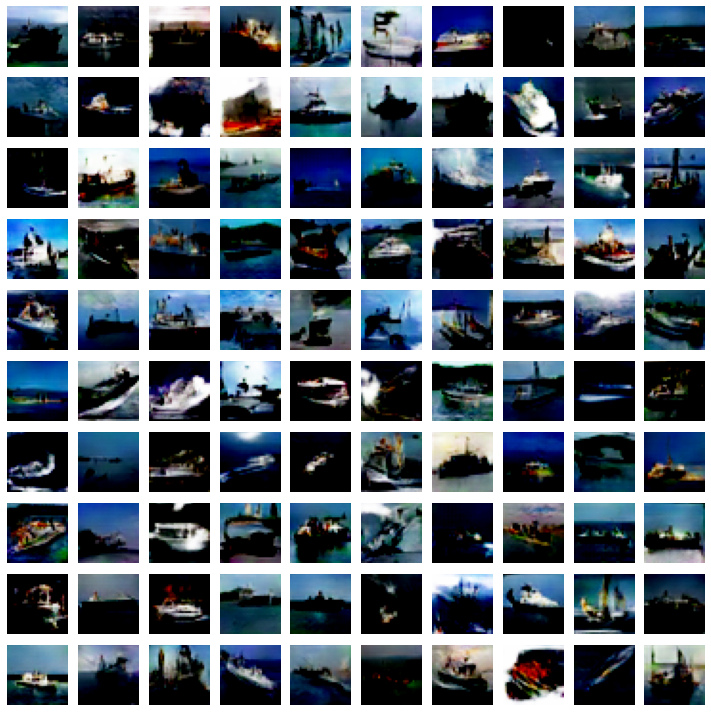

Epoch: 401/1000 	 Discriminator Loss: [0.3460781, 0.46875] 		 Generator Loss: 2.9611124992370605
Epoch: 402/1000 	 Discriminator Loss: [0.31848866, 0.484375] 		 Generator Loss: 3.4125657081604004
Epoch: 403/1000 	 Discriminator Loss: [0.27711385, 0.5] 		 Generator Loss: 3.015068769454956
Epoch: 404/1000 	 Discriminator Loss: [0.29714245, 0.5] 		 Generator Loss: 2.8218231201171875
Epoch: 405/1000 	 Discriminator Loss: [0.3680855, 0.421875] 		 Generator Loss: 3.6708712577819824
Epoch: 406/1000 	 Discriminator Loss: [0.3206294, 0.46875] 		 Generator Loss: 3.394768476486206
Epoch: 407/1000 	 Discriminator Loss: [0.30037516, 0.453125] 		 Generator Loss: 4.220261573791504
Epoch: 408/1000 	 Discriminator Loss: [0.33145326, 0.484375] 		 Generator Loss: 3.144275188446045
Epoch: 409/1000 	 Discriminator Loss: [0.33061668, 0.4375] 		 Generator Loss: 3.6391987800598145
Epoch: 410/1000 	 Discriminator Loss: [0.33442897, 0.484375] 		 Generator Loss: 2.9879355430603027
Epoch: 411/1000 	 Discriminator

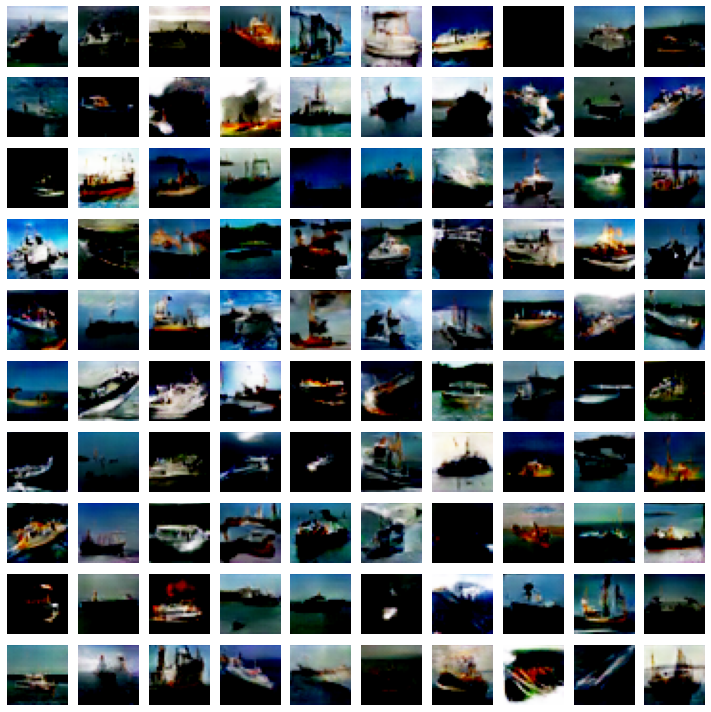

Epoch: 451/1000 	 Discriminator Loss: [0.2295183, 0.5] 		 Generator Loss: 4.191946029663086
Epoch: 452/1000 	 Discriminator Loss: [0.32979417, 0.484375] 		 Generator Loss: 3.108896255493164
Epoch: 453/1000 	 Discriminator Loss: [0.30213147, 0.484375] 		 Generator Loss: 3.8807382583618164
Epoch: 454/1000 	 Discriminator Loss: [0.29981208, 0.484375] 		 Generator Loss: 3.374178409576416
Epoch: 455/1000 	 Discriminator Loss: [0.26665127, 0.5] 		 Generator Loss: 3.2343196868896484
Epoch: 456/1000 	 Discriminator Loss: [0.28586635, 0.484375] 		 Generator Loss: 3.5827932357788086
Epoch: 457/1000 	 Discriminator Loss: [0.31787333, 0.484375] 		 Generator Loss: 3.9433181285858154
Epoch: 458/1000 	 Discriminator Loss: [0.32259032, 0.484375] 		 Generator Loss: 3.424482822418213
Epoch: 459/1000 	 Discriminator Loss: [0.33744454, 0.453125] 		 Generator Loss: 3.413741111755371
Epoch: 460/1000 	 Discriminator Loss: [0.30789173, 0.46875] 		 Generator Loss: 3.7302041053771973
Epoch: 461/1000 	 Discrimin

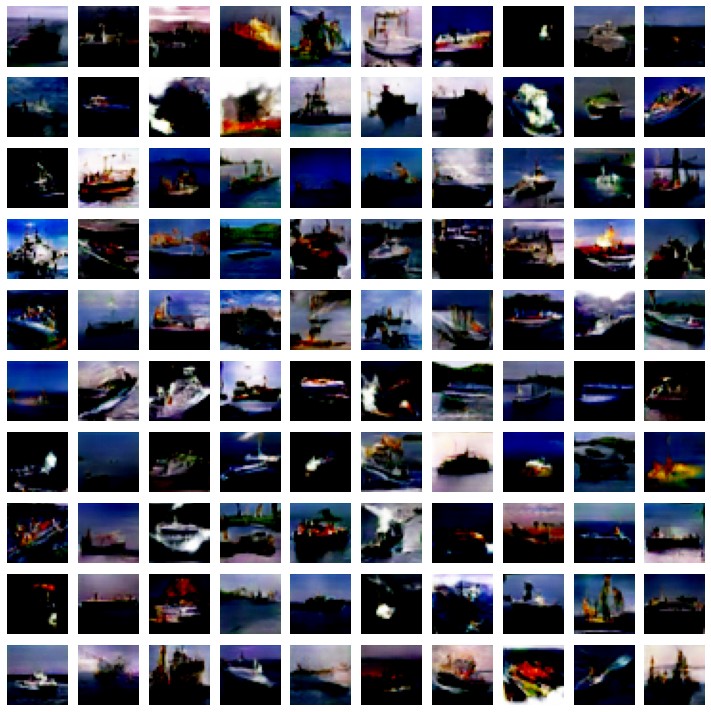

Epoch: 501/1000 	 Discriminator Loss: [0.2549652, 0.5] 		 Generator Loss: 4.574764728546143
Epoch: 502/1000 	 Discriminator Loss: [0.28290826, 0.46875] 		 Generator Loss: 3.86893892288208
Epoch: 503/1000 	 Discriminator Loss: [0.27115688, 0.484375] 		 Generator Loss: 3.2468903064727783
Epoch: 504/1000 	 Discriminator Loss: [0.2538563, 0.5] 		 Generator Loss: 3.270221710205078
Epoch: 505/1000 	 Discriminator Loss: [0.289209, 0.5] 		 Generator Loss: 2.993586778640747
Epoch: 506/1000 	 Discriminator Loss: [0.29361507, 0.484375] 		 Generator Loss: 3.899808168411255
Epoch: 507/1000 	 Discriminator Loss: [0.3754456, 0.5] 		 Generator Loss: 3.227895736694336
Epoch: 508/1000 	 Discriminator Loss: [0.26273364, 0.484375] 		 Generator Loss: 3.9746456146240234
Epoch: 509/1000 	 Discriminator Loss: [0.2544025, 0.5] 		 Generator Loss: 3.9139137268066406
Epoch: 510/1000 	 Discriminator Loss: [0.27948225, 0.5] 		 Generator Loss: 3.21224308013916
Epoch: 511/1000 	 Discriminator Loss: [0.28995928, 0.5] 

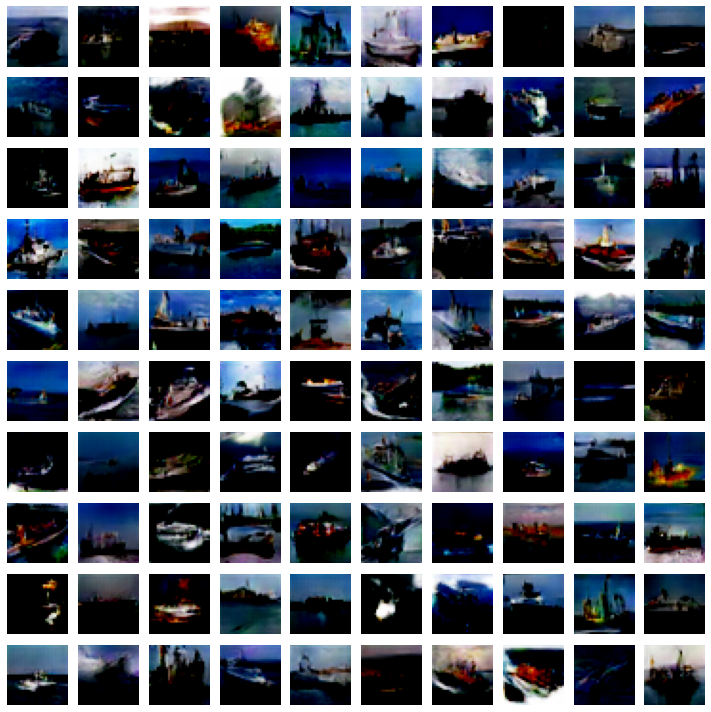

Epoch: 551/1000 	 Discriminator Loss: [0.26699582, 0.484375] 		 Generator Loss: 3.9076218605041504
Epoch: 552/1000 	 Discriminator Loss: [0.2607057, 0.5] 		 Generator Loss: 3.911717653274536
Epoch: 553/1000 	 Discriminator Loss: [0.23635542, 0.5] 		 Generator Loss: 4.339866638183594
Epoch: 554/1000 	 Discriminator Loss: [0.32079777, 0.453125] 		 Generator Loss: 3.7123727798461914
Epoch: 555/1000 	 Discriminator Loss: [0.24430853, 0.484375] 		 Generator Loss: 3.8281798362731934
Epoch: 556/1000 	 Discriminator Loss: [0.31284857, 0.484375] 		 Generator Loss: 3.4373669624328613
Epoch: 557/1000 	 Discriminator Loss: [0.30500582, 0.5] 		 Generator Loss: 3.0718839168548584
Epoch: 558/1000 	 Discriminator Loss: [0.25591156, 0.5] 		 Generator Loss: 4.022721290588379
Epoch: 559/1000 	 Discriminator Loss: [0.25816667, 0.5] 		 Generator Loss: 3.100681781768799
Epoch: 560/1000 	 Discriminator Loss: [0.27311224, 0.5] 		 Generator Loss: 3.072721242904663
Epoch: 561/1000 	 Discriminator Loss: [0.22423

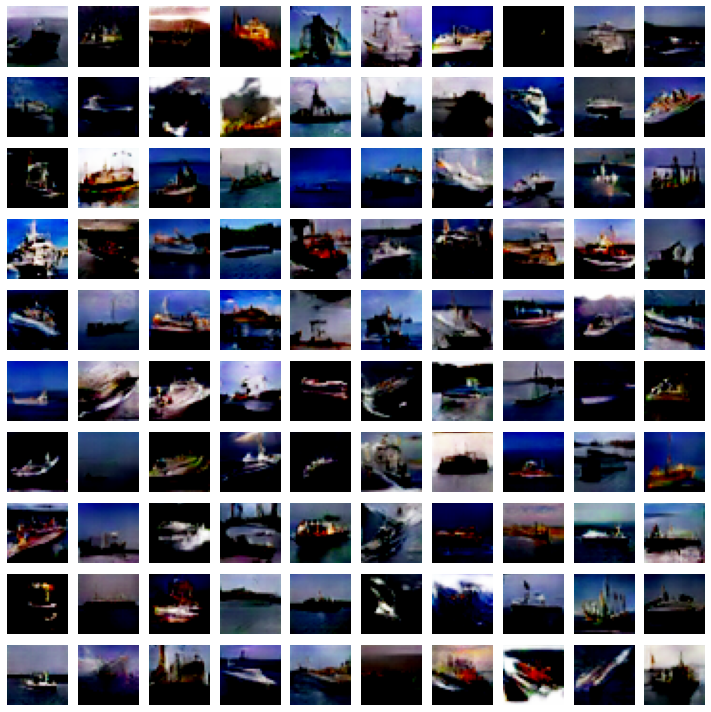

Epoch: 601/1000 	 Discriminator Loss: [0.27261874, 0.5] 		 Generator Loss: 3.9718685150146484
Epoch: 602/1000 	 Discriminator Loss: [0.27216247, 0.484375] 		 Generator Loss: 3.849111557006836
Epoch: 603/1000 	 Discriminator Loss: [0.27716076, 0.453125] 		 Generator Loss: 3.496579647064209
Epoch: 604/1000 	 Discriminator Loss: [0.234808, 0.5] 		 Generator Loss: 4.261480331420898
Epoch: 605/1000 	 Discriminator Loss: [0.27586383, 0.5] 		 Generator Loss: 4.25230073928833
Epoch: 606/1000 	 Discriminator Loss: [0.23498735, 0.5] 		 Generator Loss: 4.47254753112793
Epoch: 607/1000 	 Discriminator Loss: [0.29297948, 0.484375] 		 Generator Loss: 3.6330461502075195
Epoch: 608/1000 	 Discriminator Loss: [0.27233282, 0.46875] 		 Generator Loss: 4.718955993652344
Epoch: 609/1000 	 Discriminator Loss: [0.29020408, 0.5] 		 Generator Loss: 3.469630241394043
Epoch: 610/1000 	 Discriminator Loss: [0.30161154, 0.484375] 		 Generator Loss: 3.7810657024383545
Epoch: 611/1000 	 Discriminator Loss: [0.263488

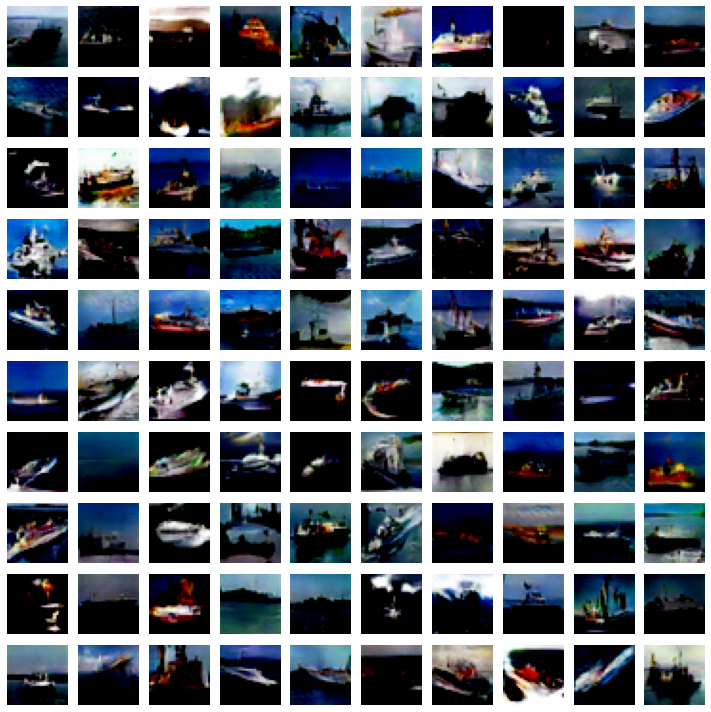

Epoch: 651/1000 	 Discriminator Loss: [0.25437325, 0.5] 		 Generator Loss: 3.704047203063965
Epoch: 652/1000 	 Discriminator Loss: [0.25061348, 0.5] 		 Generator Loss: 3.948209285736084
Epoch: 653/1000 	 Discriminator Loss: [0.25251096, 0.484375] 		 Generator Loss: 4.369747638702393
Epoch: 654/1000 	 Discriminator Loss: [0.24991328, 0.5] 		 Generator Loss: 3.981147289276123
Epoch: 655/1000 	 Discriminator Loss: [0.2658738, 0.5] 		 Generator Loss: 3.9586098194122314
Epoch: 656/1000 	 Discriminator Loss: [0.23658305, 0.5] 		 Generator Loss: 4.335703372955322
Epoch: 657/1000 	 Discriminator Loss: [0.23430721, 0.5] 		 Generator Loss: 3.900437116622925
Epoch: 658/1000 	 Discriminator Loss: [0.28124157, 0.5] 		 Generator Loss: 3.202983856201172
Epoch: 659/1000 	 Discriminator Loss: [0.23692912, 0.5] 		 Generator Loss: 3.8025245666503906
Epoch: 660/1000 	 Discriminator Loss: [0.29349047, 0.46875] 		 Generator Loss: 4.034229278564453
Epoch: 661/1000 	 Discriminator Loss: [0.25929782, 0.5] 		 G

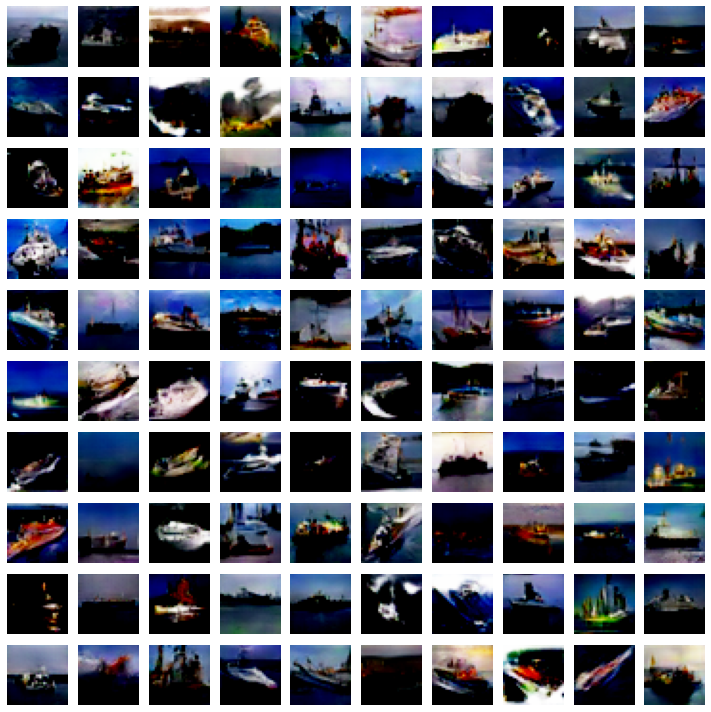

Epoch: 701/1000 	 Discriminator Loss: [0.30929217, 0.46875] 		 Generator Loss: 3.674936532974243
Epoch: 702/1000 	 Discriminator Loss: [0.23863183, 0.5] 		 Generator Loss: 4.373419761657715
Epoch: 703/1000 	 Discriminator Loss: [0.23775011, 0.484375] 		 Generator Loss: 3.9675133228302
Epoch: 704/1000 	 Discriminator Loss: [0.24776515, 0.5] 		 Generator Loss: 3.297048330307007
Epoch: 705/1000 	 Discriminator Loss: [0.29300767, 0.484375] 		 Generator Loss: 4.064876556396484
Epoch: 706/1000 	 Discriminator Loss: [0.25363046, 0.5] 		 Generator Loss: 4.180584907531738
Epoch: 707/1000 	 Discriminator Loss: [0.25222617, 0.5] 		 Generator Loss: 4.389180660247803
Epoch: 708/1000 	 Discriminator Loss: [0.26874542, 0.5] 		 Generator Loss: 4.286211013793945
Epoch: 709/1000 	 Discriminator Loss: [0.25419268, 0.484375] 		 Generator Loss: 4.030966758728027
Epoch: 710/1000 	 Discriminator Loss: [0.25796014, 0.5] 		 Generator Loss: 4.159449577331543
Epoch: 711/1000 	 Discriminator Loss: [0.2626304, 0.5

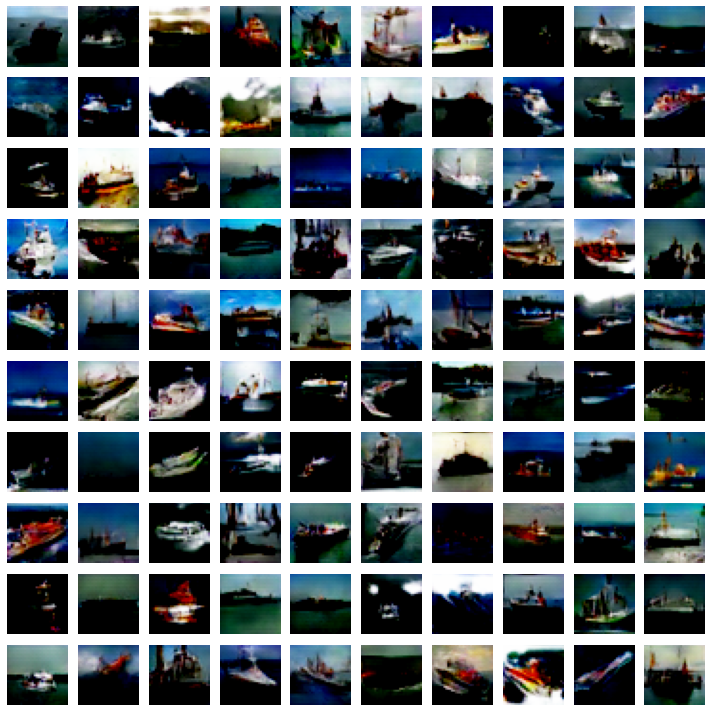

Epoch: 751/1000 	 Discriminator Loss: [0.2686965, 0.484375] 		 Generator Loss: 4.77203369140625
Epoch: 752/1000 	 Discriminator Loss: [0.23167568, 0.5] 		 Generator Loss: 4.077606201171875
Epoch: 753/1000 	 Discriminator Loss: [0.24802566, 0.484375] 		 Generator Loss: 3.6971235275268555
Epoch: 754/1000 	 Discriminator Loss: [0.2366913, 0.5] 		 Generator Loss: 4.244994163513184
Epoch: 755/1000 	 Discriminator Loss: [0.2527027, 0.484375] 		 Generator Loss: 4.646890640258789
Epoch: 756/1000 	 Discriminator Loss: [0.30167657, 0.5] 		 Generator Loss: 4.142755508422852
Epoch: 757/1000 	 Discriminator Loss: [0.26208523, 0.5] 		 Generator Loss: 4.598632335662842
Epoch: 758/1000 	 Discriminator Loss: [0.29434836, 0.5] 		 Generator Loss: 3.7556705474853516
Epoch: 759/1000 	 Discriminator Loss: [0.28159642, 0.484375] 		 Generator Loss: 3.8577520847320557
Epoch: 760/1000 	 Discriminator Loss: [0.25332004, 0.484375] 		 Generator Loss: 3.624577045440674
Epoch: 761/1000 	 Discriminator Loss: [0.27272

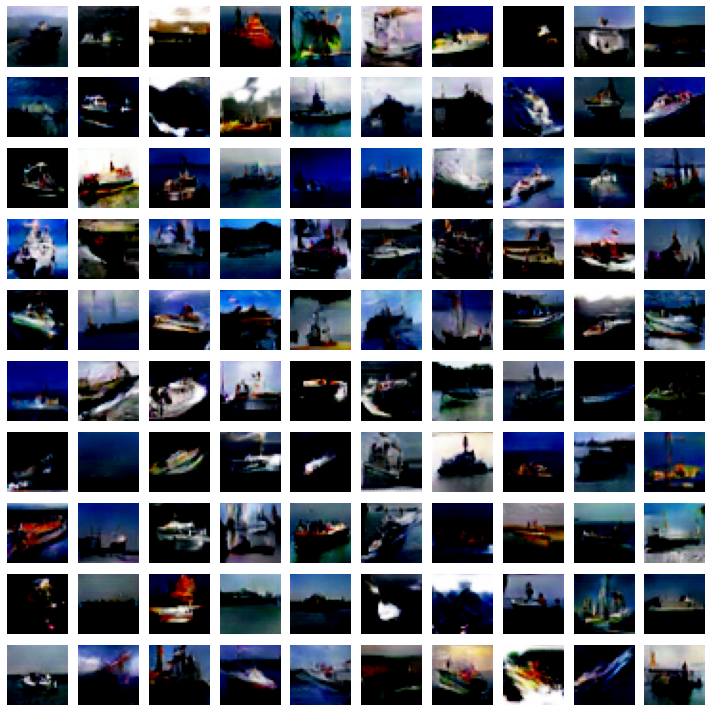

Epoch: 801/1000 	 Discriminator Loss: [0.26712745, 0.46875] 		 Generator Loss: 4.37746000289917
Epoch: 802/1000 	 Discriminator Loss: [0.28290692, 0.46875] 		 Generator Loss: 4.579626083374023
Epoch: 803/1000 	 Discriminator Loss: [0.24764113, 0.5] 		 Generator Loss: 3.960555076599121
Epoch: 804/1000 	 Discriminator Loss: [0.2678147, 0.484375] 		 Generator Loss: 4.454554557800293
Epoch: 805/1000 	 Discriminator Loss: [0.23994246, 0.5] 		 Generator Loss: 4.309950828552246
Epoch: 806/1000 	 Discriminator Loss: [0.23366618, 0.5] 		 Generator Loss: 3.723548173904419
Epoch: 807/1000 	 Discriminator Loss: [0.29693663, 0.5] 		 Generator Loss: 3.8661696910858154
Epoch: 808/1000 	 Discriminator Loss: [0.23060822, 0.5] 		 Generator Loss: 4.420840263366699
Epoch: 809/1000 	 Discriminator Loss: [0.22918448, 0.5] 		 Generator Loss: 4.4360222816467285
Epoch: 810/1000 	 Discriminator Loss: [0.28390902, 0.5] 		 Generator Loss: 4.057929992675781
Epoch: 811/1000 	 Discriminator Loss: [0.24474843, 0.5] 	

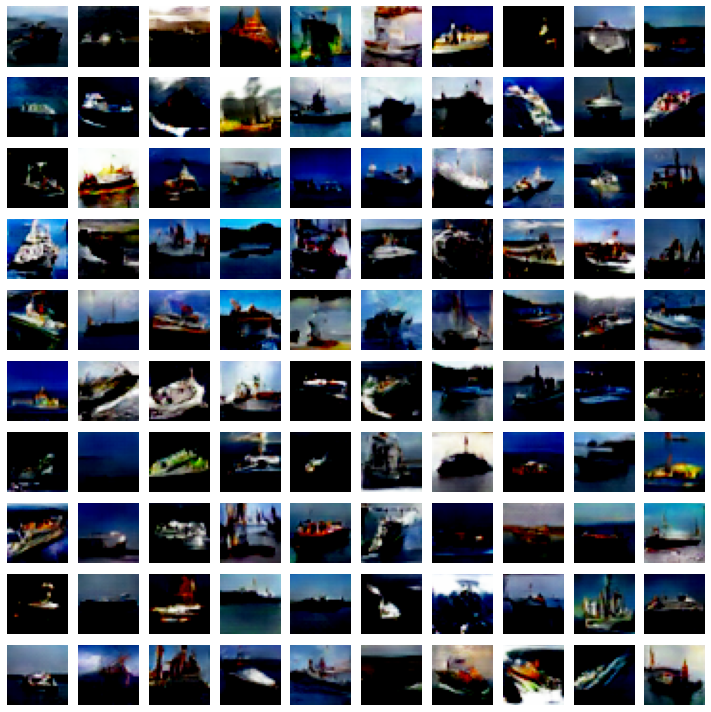

Epoch: 851/1000 	 Discriminator Loss: [0.25537416, 0.5] 		 Generator Loss: 4.495841979980469
Epoch: 852/1000 	 Discriminator Loss: [0.21633206, 0.5] 		 Generator Loss: 3.6712512969970703
Epoch: 853/1000 	 Discriminator Loss: [0.2583669, 0.46875] 		 Generator Loss: 4.721033573150635
Epoch: 854/1000 	 Discriminator Loss: [0.24209669, 0.484375] 		 Generator Loss: 4.901401042938232
Epoch: 855/1000 	 Discriminator Loss: [0.24020356, 0.5] 		 Generator Loss: 4.729657173156738
Epoch: 856/1000 	 Discriminator Loss: [0.22343281, 0.5] 		 Generator Loss: 4.642461776733398
Epoch: 857/1000 	 Discriminator Loss: [0.24078044, 0.5] 		 Generator Loss: 3.8252224922180176
Epoch: 858/1000 	 Discriminator Loss: [0.25159734, 0.5] 		 Generator Loss: 4.1478190422058105
Epoch: 859/1000 	 Discriminator Loss: [0.2313354, 0.5] 		 Generator Loss: 4.726246356964111
Epoch: 860/1000 	 Discriminator Loss: [0.22786647, 0.5] 		 Generator Loss: 4.04133939743042
Epoch: 861/1000 	 Discriminator Loss: [0.23925771, 0.5] 		 Ge

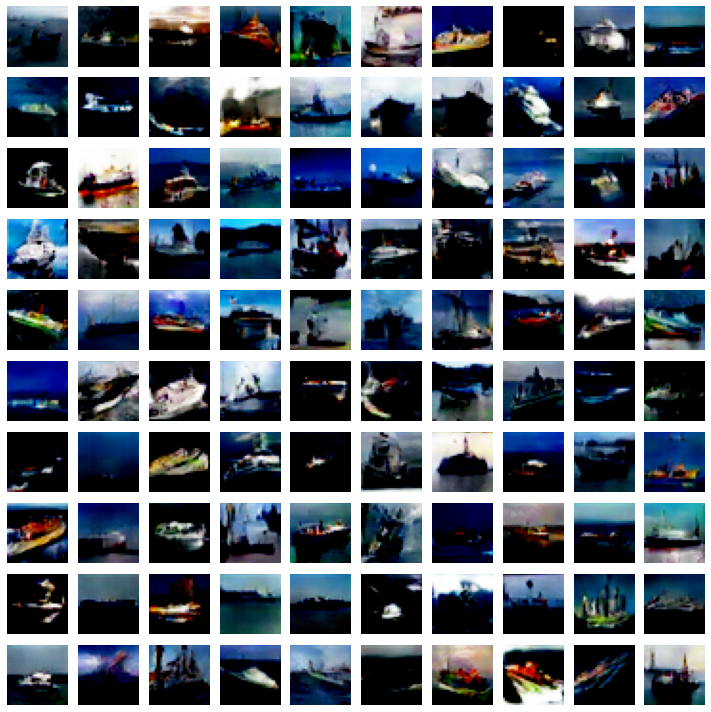

Epoch: 901/1000 	 Discriminator Loss: [0.23280571, 0.5] 		 Generator Loss: 4.800265312194824
Epoch: 902/1000 	 Discriminator Loss: [0.21917756, 0.5] 		 Generator Loss: 4.500188827514648
Epoch: 903/1000 	 Discriminator Loss: [0.24094865, 0.5] 		 Generator Loss: 4.323929786682129
Epoch: 904/1000 	 Discriminator Loss: [0.26265013, 0.5] 		 Generator Loss: 4.0380330085754395
Epoch: 905/1000 	 Discriminator Loss: [0.23652634, 0.5] 		 Generator Loss: 3.8529462814331055
Epoch: 906/1000 	 Discriminator Loss: [0.27274293, 0.46875] 		 Generator Loss: 4.514857292175293
Epoch: 907/1000 	 Discriminator Loss: [0.2248613, 0.5] 		 Generator Loss: 4.250998497009277
Epoch: 908/1000 	 Discriminator Loss: [0.2479862, 0.5] 		 Generator Loss: 3.8874459266662598
Epoch: 909/1000 	 Discriminator Loss: [0.2488605, 0.484375] 		 Generator Loss: 3.965013027191162
Epoch: 910/1000 	 Discriminator Loss: [0.2522439, 0.5] 		 Generator Loss: 4.068154811859131
Epoch: 911/1000 	 Discriminator Loss: [0.2311944, 0.5] 		 Gene

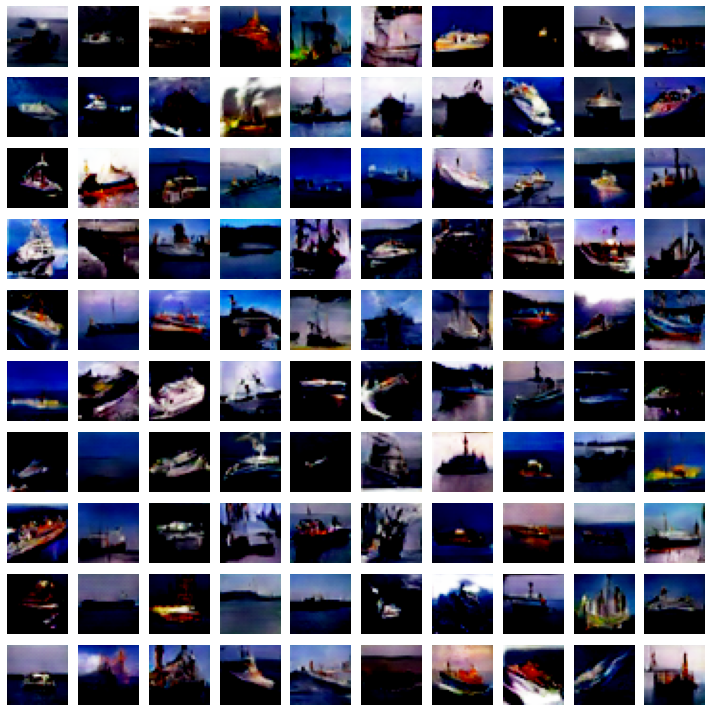

Epoch: 951/1000 	 Discriminator Loss: [0.23048982, 0.484375] 		 Generator Loss: 4.144845008850098
Epoch: 952/1000 	 Discriminator Loss: [0.21753189, 0.5] 		 Generator Loss: 3.2869558334350586
Epoch: 953/1000 	 Discriminator Loss: [0.26016182, 0.484375] 		 Generator Loss: 4.718790054321289
Epoch: 954/1000 	 Discriminator Loss: [0.2326828, 0.5] 		 Generator Loss: 4.499080657958984
Epoch: 955/1000 	 Discriminator Loss: [0.21498954, 0.5] 		 Generator Loss: 3.895512104034424
Epoch: 956/1000 	 Discriminator Loss: [0.22206846, 0.5] 		 Generator Loss: 3.787320613861084
Epoch: 957/1000 	 Discriminator Loss: [0.2179497, 0.5] 		 Generator Loss: 4.593153953552246
Epoch: 958/1000 	 Discriminator Loss: [0.23088025, 0.5] 		 Generator Loss: 4.5982160568237305
Epoch: 959/1000 	 Discriminator Loss: [0.2379603, 0.5] 		 Generator Loss: 3.950782537460327
Epoch: 960/1000 	 Discriminator Loss: [0.22808436, 0.5] 		 Generator Loss: 4.545289993286133
Epoch: 961/1000 	 Discriminator Loss: [0.22710407, 0.5] 		 Ge

In [14]:
# Constant noise for viewing how the GAN progresses
static_noise = np.random.normal(0, 1, size=(100, noise_dim))

disc_loss = []
gen_loss = []

# Training loop
for epoch in range(epochs):
    for batch in range(steps_per_epoch):
        # generate noise/x train data for gan/generator
        noise = np.random.normal(0, 1, size=(batch_size, noise_dim))
        # fetch real data
        real_x = x_train[np.random.randint(0, x_train.shape[0], size=batch_size)]
        # generate fake data
        fake_x = generator.predict(noise)

        # combine fake and real data to generate x_train values for discriminator
        x = np.concatenate((real_x, fake_x))

        # generate y_train for discriminator by setting 0.9 for real data and 0 for fake data
        disc_y = np.zeros(2*batch_size)
        disc_y[:batch_size] = 0.9

        # train discriminator
        d_loss = discriminator.train_on_batch(x, disc_y)

        # generate y_train for gan/generator
        y_gen = np.ones(batch_size)
        
        # train gan/generator
        g_loss = gan.train_on_batch(noise, y_gen)
        
    disc_loss.append(d_loss)
    gen_loss.append(g_loss)
    
    # display progress after every epoch
    print(f'Epoch: {epoch}/{epochs} \t Discriminator Loss: {d_loss} \t\t Generator Loss: {g_loss}')
    
    if epoch % 50 == 0:
        show_images(static_noise, epoch)

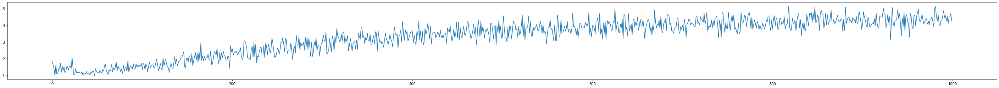

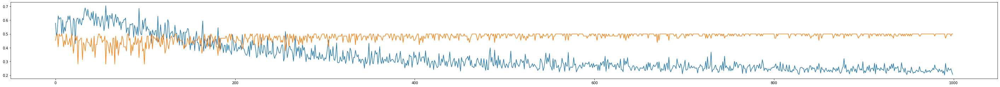

In [15]:
# looking at the loss pattern of generator and discriminator
plt.figure(figsize=(50, 4))
plt.plot(gen_loss);
plt.show()
plt.figure(figsize=(50, 4))
plt.plot(disc_loss);
plt.show()

realdata scores: [[0.9250978 ]
 [0.86094904]
 [0.90675366]
 [0.8831089 ]
 [0.97456545]
 [0.93984294]
 [0.9808627 ]
 [0.7364507 ]
 [0.8904724 ]
 [0.9355217 ]]
average: 0.9033626
fakedata scores: [[0.01353928]
 [0.00194126]
 [0.03024024]
 [0.04542905]
 [0.00903967]
 [0.01667434]
 [0.00702828]
 [0.00473401]
 [0.02536394]
 [0.01002385]]
average: 0.016401393


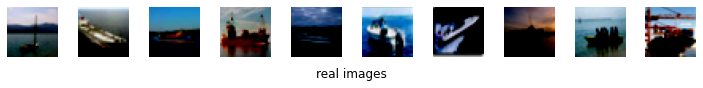

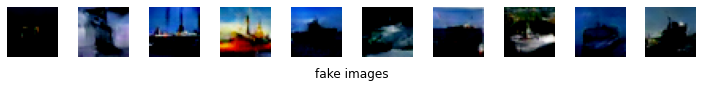

In [18]:
# get random numbers from real dataset and predict
real_data = x_train[np.random.randint(0, x_train.shape[0], 10)]
realdata_scores = discriminator.predict(real_data)
print('realdata scores:', realdata_scores)
print('average:', np.mean(realdata_scores))

noise = np.random.normal(0, 1, size=(10, noise_dim))
fake_data = generator.predict(noise)
fakedata_scores = discriminator.predict(fake_data)
print('fakedata scores:', fakedata_scores)
print('average:', np.mean(fakedata_scores))

plt.figure(figsize=(10, 1))
plt.suptitle('real images', y=0)
for i, image in enumerate(real_data):
    plt.subplot(1, 10, i+1)
    if channels == 1:
        plt.imshow(np.clip(image.reshape((img_rows, img_cols)), 0.0, 1.0), cmap='gray')
    else:
        plt.imshow(np.clip(image.reshape((img_rows, img_cols, channels)), 0.0, 1.0))
    plt.axis('off')

plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 1))
plt.suptitle('fake images', y=0)
for i, image in enumerate(fake_data):
    plt.subplot(1, 10, i+1)
    if channels == 1:
        plt.imshow(np.clip(image.reshape((img_rows, img_cols)), 0.0, 1.0), cmap='gray')
    else:
        plt.imshow(np.clip(image.reshape((img_rows, img_cols, channels)), 0.0, 1.0))
    plt.axis('off')

plt.tight_layout()


In [17]:
# Turn the training process into a GIF
from PIL import Image, ImageDraw

image_names = os.listdir(save_path)
frames = []
for image in sorted(image_names, key=lambda name: int(''.join(i for i in name if i.isdigit()))):
    frames.append(Image.open(save_path + '/' + image))

frames[0].save('gan_training_ship.gif', format='GIF', append_images=frames[1:], save_all=True, duration=500, loop=0)

discriminator.save('dcdiscriminator.hdf5')
generator.save('dcgenerator.hdf5')